In [55]:
#  Imports (Cell 1)
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.feature import hog
from sklearn import svm
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.utils.multiclass import unique_labels
from google.colab import files




In [17]:
# Upload zipped dataset
uploaded = files.upload()

# Extract uploaded zip (assumes it's a zip of folders per label)
import zipfile
for fn in uploaded:
    if fn.endswith('.zip'):
        with zipfile.ZipFile(fn, 'r') as zip_ref:
            zip_ref.extractall("/content/coin_dataset")

# Set dataset directory
data_dir = "/content/coin_dataset/coin_dataset"


Saving coin_dataset.zip to coin_dataset.zip


SVM Accuracy: 0.9430604982206405
              precision    recall  f1-score   support

      10cent       0.93      0.84      0.88        75
       1rand       0.96      0.96      0.96       143
      20cent       0.95      0.99      0.97       143
       2rand       0.89      0.95      0.92       101
      50cent       0.96      0.96      0.96       134
       5cent       0.96      1.00      0.98        93
       5rand       0.93      0.89      0.91       154

    accuracy                           0.94       843
   macro avg       0.94      0.94      0.94       843
weighted avg       0.94      0.94      0.94       843



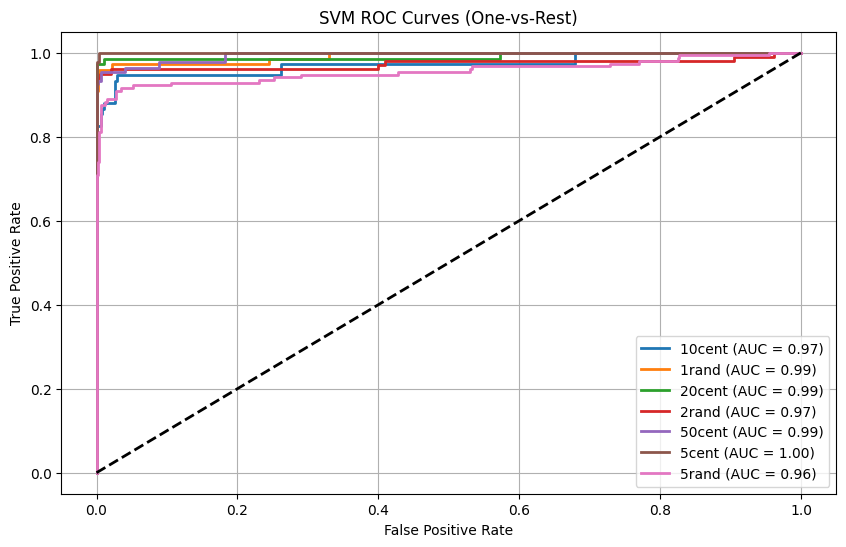

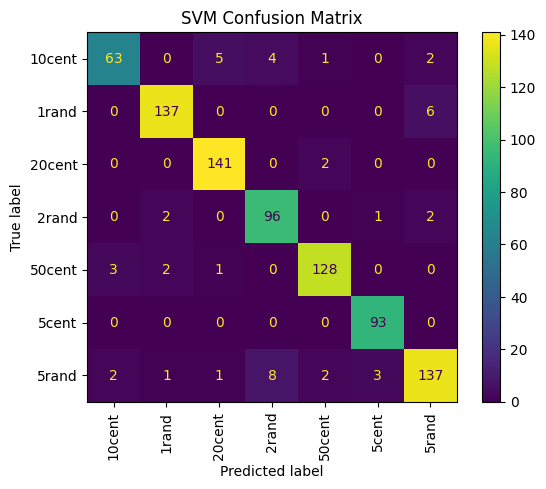

 Random Forest Accuracy: 0.8801897983392646
              precision    recall  f1-score   support

      10cent       0.97      0.77      0.86        75
       1rand       0.96      0.90      0.93       143
      20cent       1.00      0.96      0.98       143
       2rand       0.78      0.86      0.82       101
      50cent       0.97      0.84      0.90       134
       5cent       0.64      1.00      0.78        93
       5rand       0.91      0.82      0.86       154

    accuracy                           0.88       843
   macro avg       0.89      0.88      0.87       843
weighted avg       0.90      0.88      0.88       843



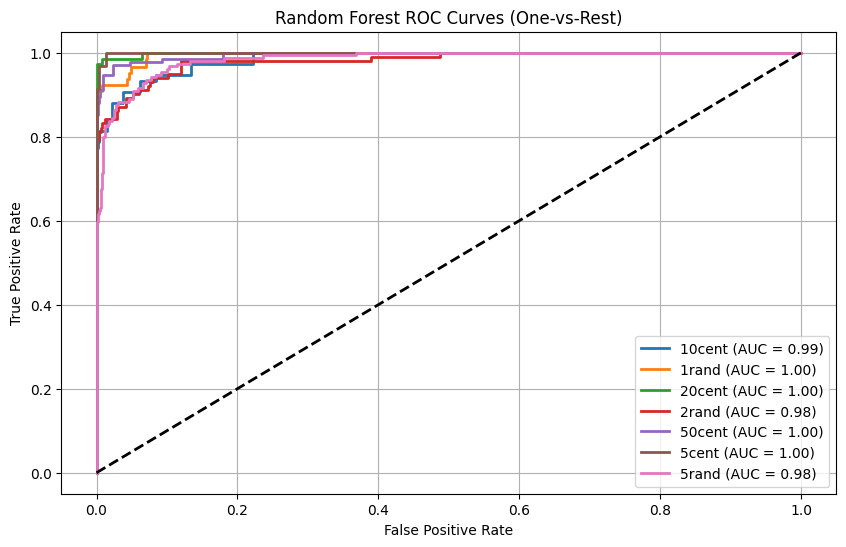

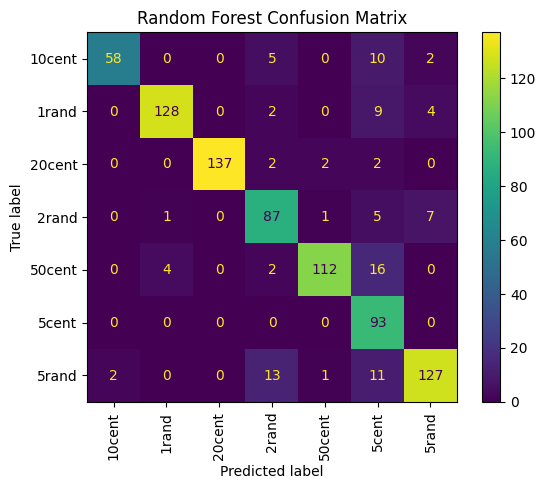

In [57]:
# Dataset path
data_dir = "/content/coin_dataset/coin_dataset"

#  Preprocess & Segment coin image (returns largest segmented object)
def preprocess_and_segment(img_path):
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    img = cv2.resize(img, (128, 128))
    blurred = cv2.GaussianBlur(img, (5, 5), 0)

    _, thresh = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    mask = np.zeros_like(img)
    if contours:
        largest_contour = max(contours, key=cv2.contourArea)
        cv2.drawContours(mask, [largest_contour], -1, 255, thickness=cv2.FILLED)

    segmented = cv2.bitwise_and(img, img, mask=mask)
    equalized = cv2.equalizeHist(segmented)
    normalized = equalized / 255.0
    return normalized

# HOG feature extractor
def extract_hog_features(img, orientations=9, pixels_per_cell=(8, 8), cells_per_block=(2, 2)):
    return hog(img, orientations=orientations, pixels_per_cell=pixels_per_cell,
               cells_per_block=cells_per_block, block_norm='L2-Hys')

# ---------------------------- SVM Feature Extraction ----------------------------
features_svm = []
labels_svm = []

for label in os.listdir(data_dir):
    label_path = os.path.join(data_dir, label)
    if not os.path.isdir(label_path):
        continue
    for file in os.listdir(label_path):
        if file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tif', '.tiff', '.webp')):
            try:
                img = preprocess_and_segment(os.path.join(label_path, file))
                fd = extract_hog_features(img)
                features_svm.append(fd)
                labels_svm.append(label)
            except Exception as e:
                print(f" Error on {file}: {e}")

X_svm = np.array(features_svm)
label_encoder = LabelEncoder()
y_svm = label_encoder.fit_transform(labels_svm)

#  Correct scaler for SVM
scaler_svm = StandardScaler()
X_svm_scaled = scaler_svm.fit_transform(X_svm)

X_train_svm, X_test_svm, y_train_svm, y_test_svm = train_test_split(X_svm_scaled, y_svm, test_size=0.2, random_state=42)

svm_classifier = svm.SVC(kernel='rbf', gamma='scale', C=10, class_weight='balanced')
svm_classifier.fit(X_train_svm, y_train_svm)

y_pred_svm = svm_classifier.predict(X_test_svm)
print("SVM Accuracy:", accuracy_score(y_test_svm, y_pred_svm))
print(classification_report(y_test_svm, y_pred_svm, target_names=label_encoder.inverse_transform(unique_labels(y_test_svm, y_pred_svm))))

from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc, RocCurveDisplay

# One-vs-Rest encoding for multiclass ROC
y_test_svm_bin = label_binarize(y_test_svm, classes=range(len(label_encoder.classes_)))

# Decision scores for each class
y_score_svm = svm_classifier.decision_function(X_test_svm)

# Plot ROC curve for each class
plt.figure(figsize=(10, 6))
for i in range(len(label_encoder.classes_)):
    fpr, tpr, _ = roc_curve(y_test_svm_bin[:, i], y_score_svm[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f"{label_encoder.classes_[i]} (AUC = {roc_auc:.2f})")

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.title("SVM ROC Curves (One-vs-Rest)")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

ConfusionMatrixDisplay.from_predictions(y_test_svm, y_pred_svm, display_labels=label_encoder.classes_, xticks_rotation=90)
plt.title("SVM Confusion Matrix")
plt.show()

# ---------------------------- Random Forest Feature Extraction ----------------------------
features_rf = []
labels_rf = []

for label in os.listdir(data_dir):
    label_path = os.path.join(data_dir, label)
    if not os.path.isdir(label_path):
        continue
    for file in os.listdir(label_path):
        if file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tif', '.tiff', '.webp')):
            try:
                img = preprocess_and_segment(os.path.join(label_path, file))
                fd = extract_hog_features(img, orientations=12, pixels_per_cell=(4, 4))
                features_rf.append(fd)
                labels_rf.append(label)
            except Exception as e:
                print(f" RF Error on {file}: {e}")

X_rf = np.array(features_rf)
y_rf = label_encoder.transform(labels_rf)  # same encoder as SVM

#  Correct scaler for RF
scaler_rf = StandardScaler()
X_rf_scaled = scaler_rf.fit_transform(X_rf)

X_train_rf, X_test_rf, y_train_rf, y_test_rf = train_test_split(X_rf_scaled, y_rf, test_size=0.2, random_state=42)

rf_classifier = RandomForestClassifier(n_estimators=300, max_depth=25, min_samples_split=4, min_samples_leaf=2,
                                       class_weight='balanced', random_state=42)
rf_classifier.fit(X_train_rf, y_train_rf)

y_pred_rf = rf_classifier.predict(X_test_rf)
print(" Random Forest Accuracy:", accuracy_score(y_test_rf, y_pred_rf))
print(classification_report(y_test_rf, y_pred_rf, target_names=label_encoder.inverse_transform(unique_labels(y_test_rf, y_pred_rf))))

# One-vs-Rest encoding for multiclass ROC
y_test_rf_bin = label_binarize(y_test_rf, classes=range(len(label_encoder.classes_)))

# Probabilities for each class
y_score_rf = rf_classifier.predict_proba(X_test_rf)

# Plot ROC curve for each class
plt.figure(figsize=(10, 6))
for i in range(len(label_encoder.classes_)):
    fpr, tpr, _ = roc_curve(y_test_rf_bin[:, i], y_score_rf[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f"{label_encoder.classes_[i]} (AUC = {roc_auc:.2f})")

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.title("Random Forest ROC Curves (One-vs-Rest)")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

ConfusionMatrixDisplay.from_predictions(y_test_rf, y_pred_rf, display_labels=label_encoder.classes_, xticks_rotation=90)
plt.title("Random Forest Confusion Matrix")
plt.show()

# ---------------------------- visualization function ----------------------------
def visualize_processing_steps(img_path):
    img_orig = cv2.imread(img_path)
    img_gray = cv2.cvtColor(img_orig, cv2.COLOR_BGR2GRAY)
    img_resized = cv2.resize(img_gray, (128, 128))
    blurred = cv2.GaussianBlur(img_resized, (5, 5), 0)
    _, thresh = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    mask = np.zeros_like(img_resized)
    if contours:
        largest_contour = max(contours, key=cv2.contourArea)
        cv2.drawContours(mask, [largest_contour], -1, 255, thickness=cv2.FILLED)

    segmented = cv2.bitwise_and(img_resized, img_resized, mask=mask)
    equalized = cv2.equalizeHist(segmented)
    normalized = equalized / 255.0

    # Extract HOG just for visualization
    fd, hog_img = hog(normalized, orientations=9, pixels_per_cell=(8, 8),
                      cells_per_block=(2, 2), block_norm='L2-Hys', visualize=True)

    fig, axs = plt.subplots(2, 4, figsize=(18, 8))
    axs = axs.ravel()

    axs[0].imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
    axs[0].set_title("Original Image")

    axs[1].imshow(img_gray, cmap='gray')
    axs[1].set_title("Grayscale")

    axs[2].imshow(blurred, cmap='gray')
    axs[2].set_title("Gaussian Blurred")

    axs[3].imshow(thresh, cmap='gray')
    axs[3].set_title("Thresholded")

    axs[4].imshow(mask, cmap='gray')
    axs[4].set_title("Mask (Largest Contour)")

    axs[5].imshow(segmented, cmap='gray')
    axs[5].set_title("Segmented Coin")

    axs[6].imshow(equalized, cmap='gray')
    axs[6].set_title("Histogram Equalized")

    axs[7].imshow(hog_img, cmap='gray')
    axs[7].set_title("HOG Visualization")

    for ax in axs:
        ax.axis('off')
    plt.tight_layout()
    plt.show()


Saving Test_data.zip to Test_data.zip

 Predicting: old_R5_2.JPG


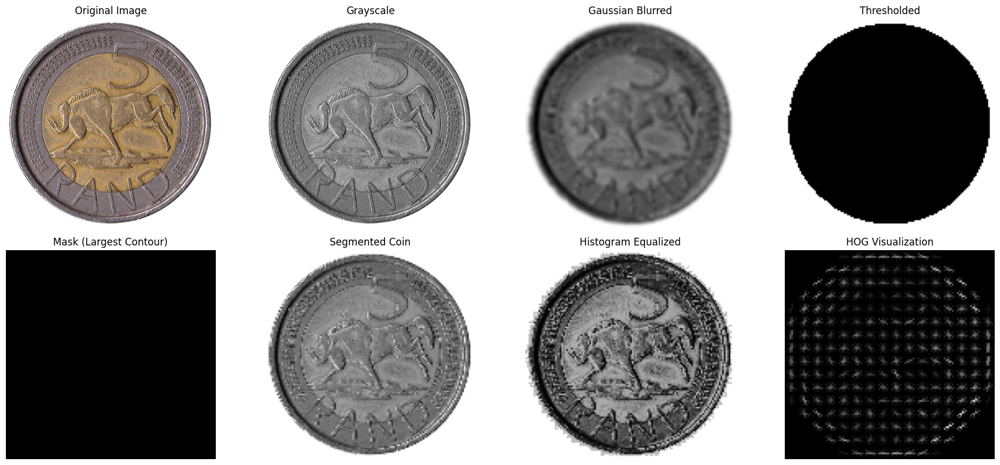

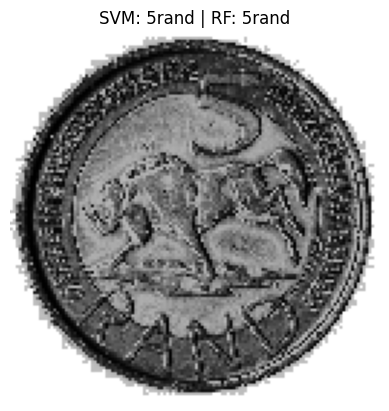

🪙 Predicted with SVM: 5rand
🪙 Predicted with RF: 5rand

 Predicting: new_20C.JPG


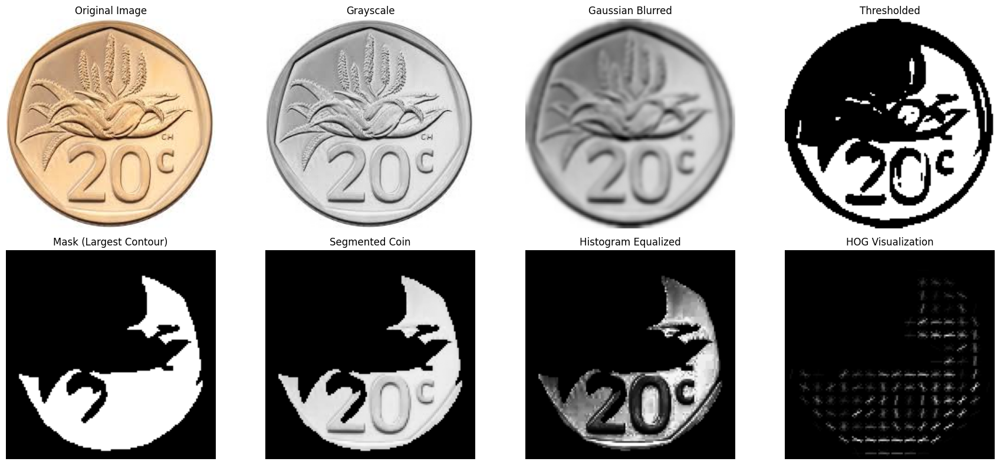

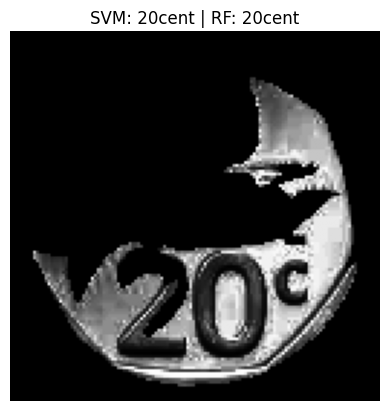

🪙 Predicted with SVM: 20cent
🪙 Predicted with RF: 20cent

 Predicting: r1_2.jpg


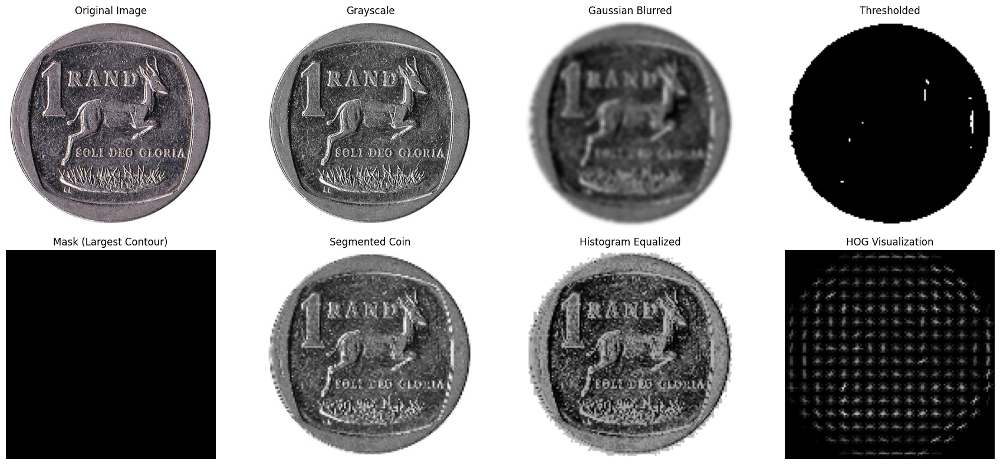

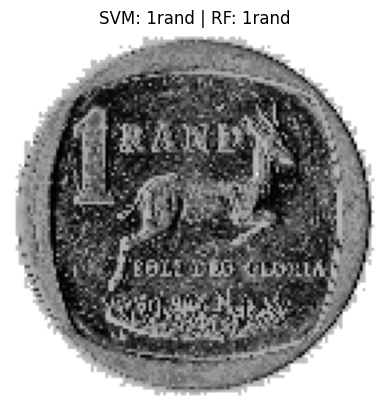

🪙 Predicted with SVM: 1rand
🪙 Predicted with RF: 1rand

 Predicting: old_10C.jpg


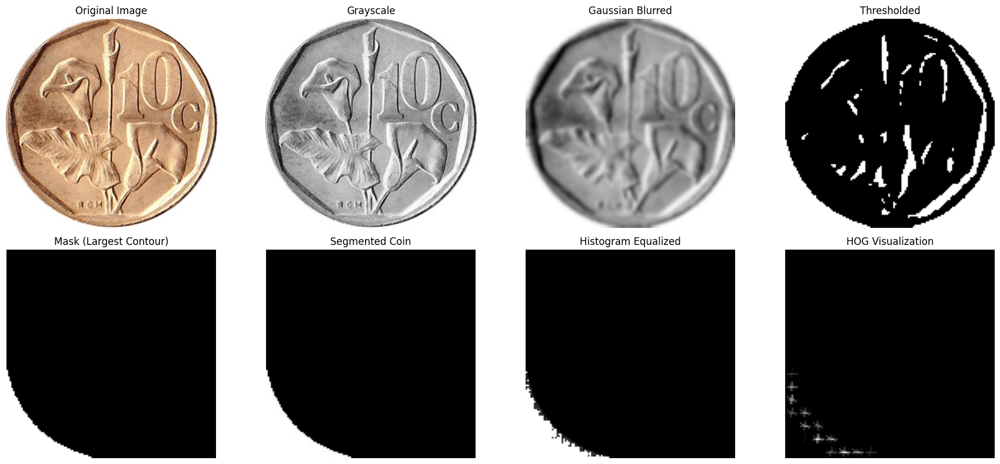

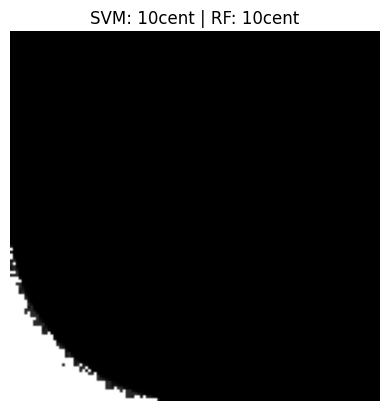

🪙 Predicted with SVM: 10cent
🪙 Predicted with RF: 10cent

 Predicting: S_Old_R1.jpg


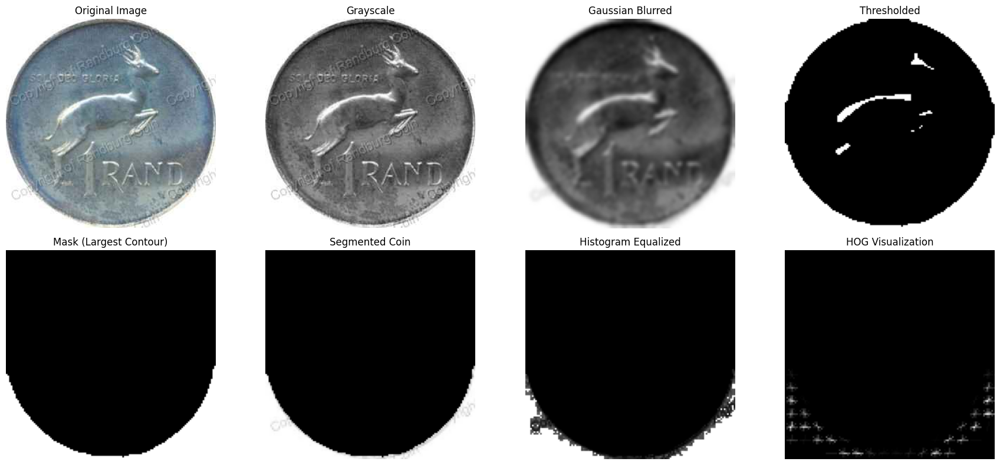

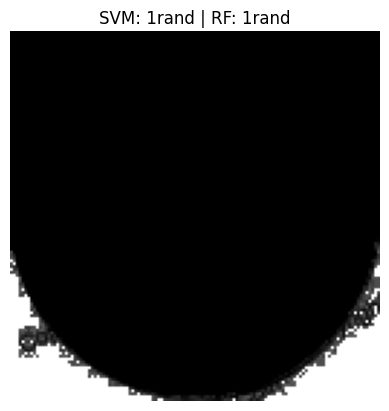

🪙 Predicted with SVM: 1rand
🪙 Predicted with RF: 1rand

 Predicting: 5C.jpg


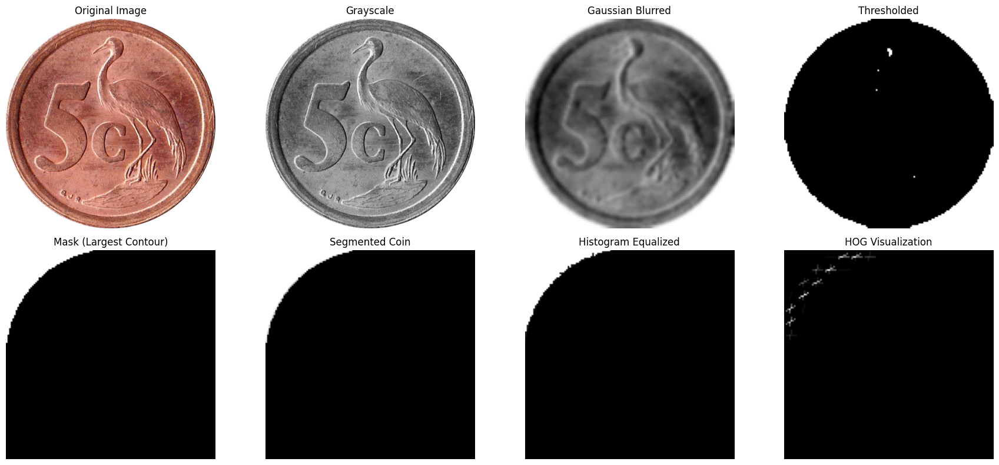

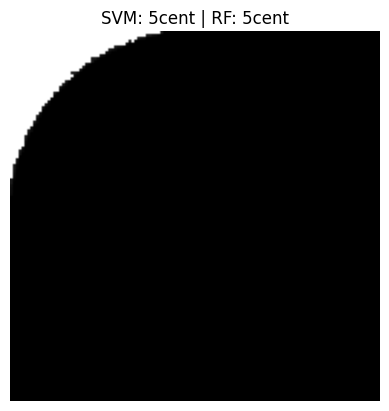

🪙 Predicted with SVM: 5cent
🪙 Predicted with RF: 5cent

 Predicting: new_R5.jpg


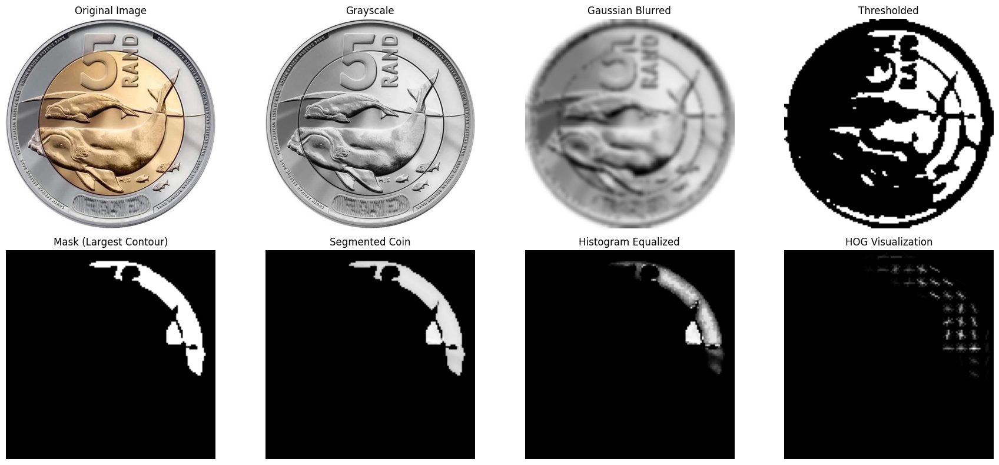

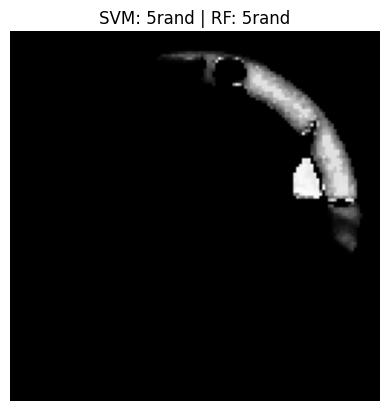

🪙 Predicted with SVM: 5rand
🪙 Predicted with RF: 5rand

 Predicting: new_10C.jpg


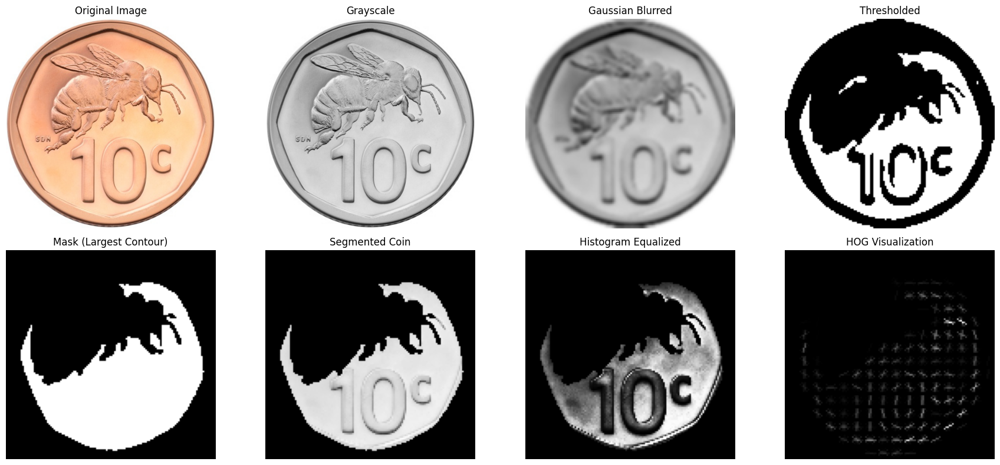

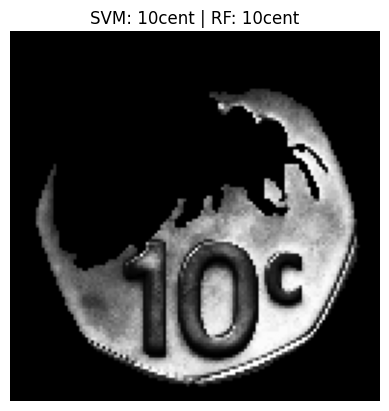

🪙 Predicted with SVM: 10cent
🪙 Predicted with RF: 10cent

 Predicting: old_R2.jpg


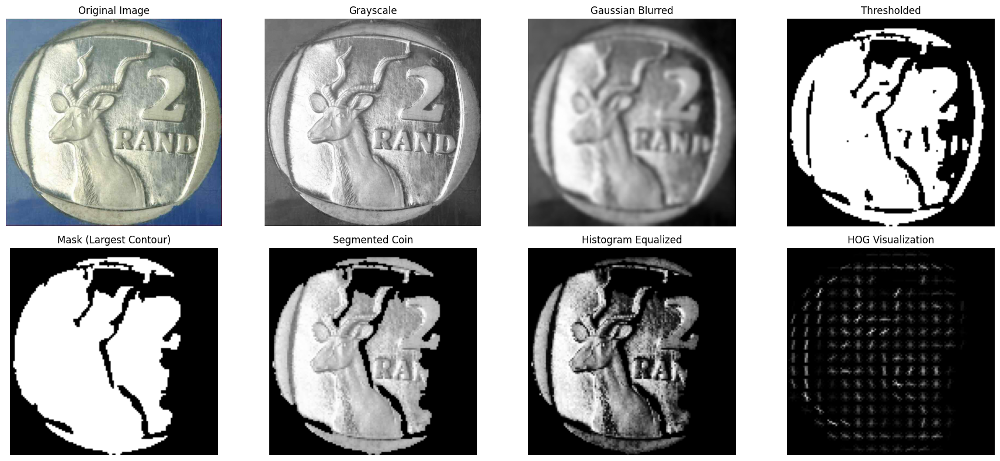

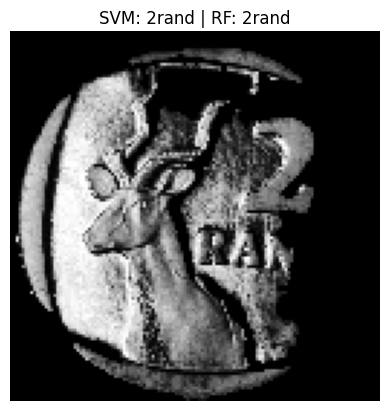

🪙 Predicted with SVM: 2rand
🪙 Predicted with RF: 2rand

 Predicting: old_R5_1.jpg


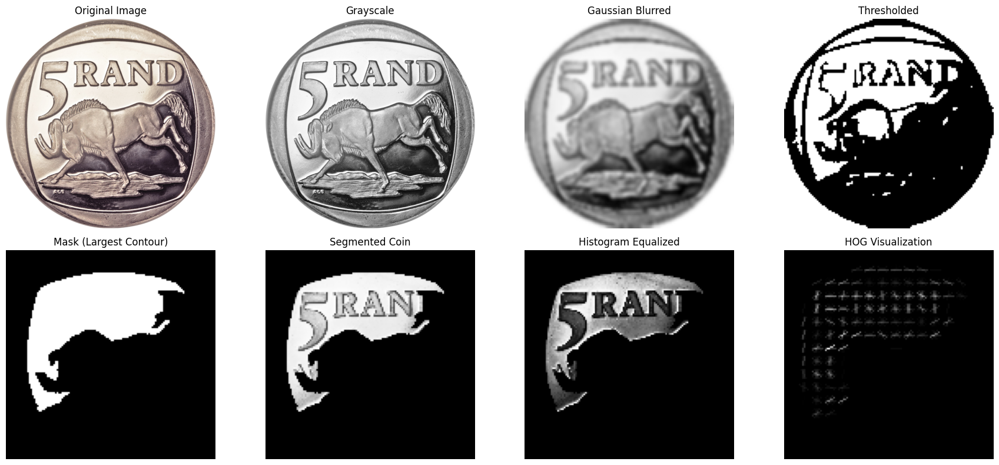

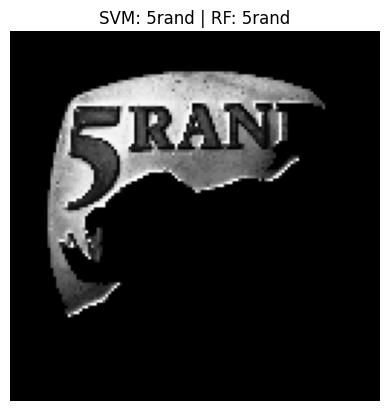

🪙 Predicted with SVM: 5rand
🪙 Predicted with RF: 5rand

 Predicting: old_20C.JPG


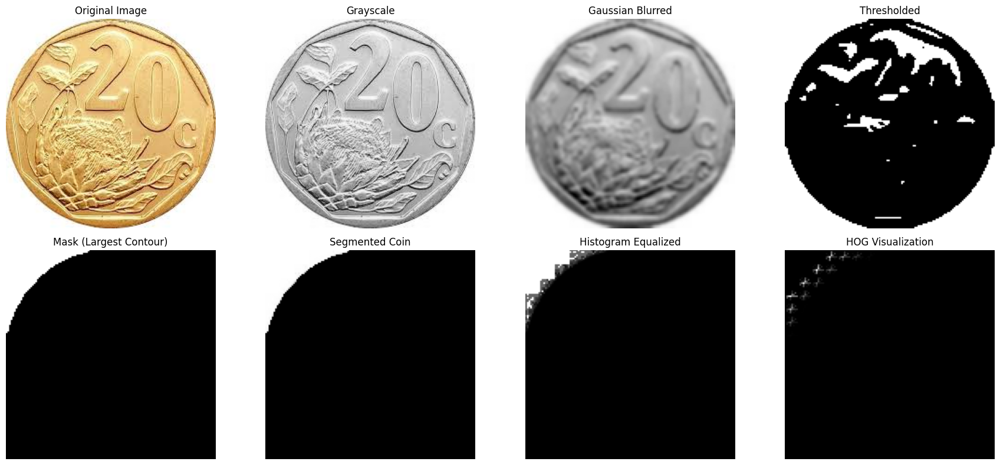

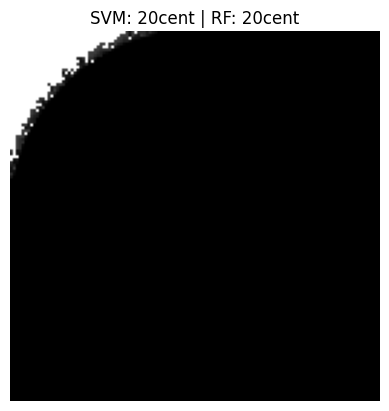

🪙 Predicted with SVM: 20cent
🪙 Predicted with RF: 20cent

 Predicting: old_5OC.jpeg


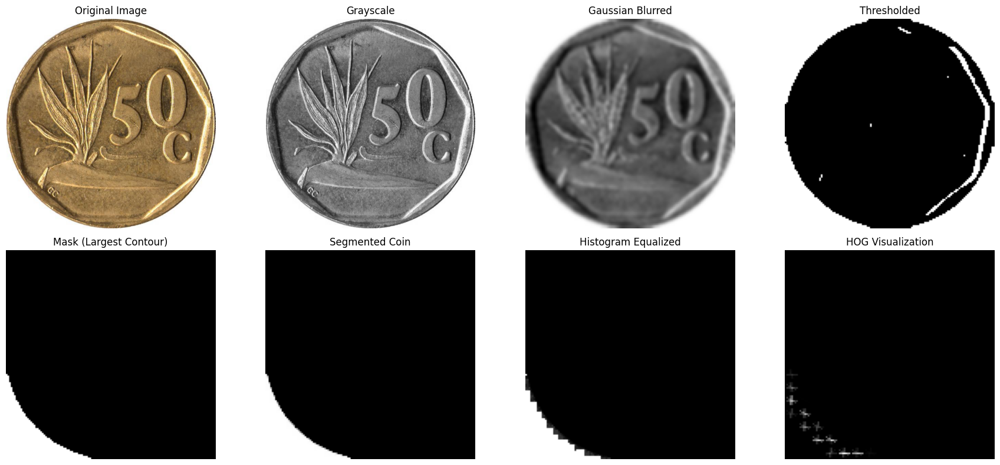

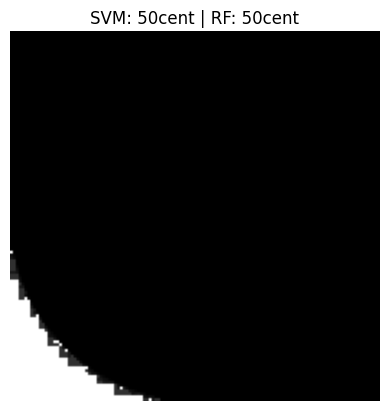

🪙 Predicted with SVM: 50cent
🪙 Predicted with RF: 50cent


In [58]:
import zipfile
import tempfile

# ---------------------------- Predict from Upload (ZIP or Image) ----------------------------
uploaded = files.upload()

for filename in uploaded:
    try:
        if filename.endswith('.zip'):
            # Handle ZIP: Extract to temp dir
            with zipfile.ZipFile(filename, 'r') as zip_ref:
                temp_dir = tempfile.mkdtemp()
                zip_ref.extractall(temp_dir)

                #  Loop through all images in the zip
                for root, dirs, files_in_zip in os.walk(temp_dir):
                    for file_in_zip in files_in_zip:
                        if file_in_zip.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tif', '.tiff', '.webp')):
                            full_path = os.path.join(root, file_in_zip)

                            print(f"\n Predicting: {file_in_zip}")
                            visualize_processing_steps(full_path)
                            img = preprocess_and_segment(full_path)

                            # Predict with SVM
                            fd_svm = extract_hog_features(img)
                            fd_scaled_svm = scaler_svm.transform([fd_svm])
                            pred_svm = svm_classifier.predict(fd_scaled_svm)
                            label_svm = label_encoder.inverse_transform(pred_svm)[0]

                            # Predict with RF
                            fd_rf = extract_hog_features(img, orientations=12, pixels_per_cell=(4, 4))
                            fd_scaled_rf = scaler_rf.transform([fd_rf])
                            pred_rf = rf_classifier.predict(fd_scaled_rf)
                            label_rf = label_encoder.inverse_transform(pred_rf)[0]

                            plt.imshow(img, cmap='gray')
                            plt.title(f"SVM: {label_svm} | RF: {label_rf}")
                            plt.axis('off')
                            plt.show()

                            print(f"🪙 Predicted with SVM: {label_svm}")
                            print(f"🪙 Predicted with RF: {label_rf}")

        else:
            # Handle Single Image
            print(f"\n Predicting: {filename}")
            visualize_processing_steps(filename)
            img = preprocess_and_segment(filename)

            # Predict with SVM
            fd_svm = extract_hog_features(img)
            fd_scaled_svm = scaler_svm.transform([fd_svm])
            pred_svm = svm_classifier.predict(fd_scaled_svm)
            label_svm = label_encoder.inverse_transform(pred_svm)[0]

            # Predict with RF
            fd_rf = extract_hog_features(img, orientations=12, pixels_per_cell=(4, 4))
            fd_scaled_rf = scaler_rf.transform([fd_rf])
            pred_rf = rf_classifier.predict(fd_scaled_rf)
            label_rf = label_encoder.inverse_transform(pred_rf)[0]

            plt.imshow(img, cmap='gray')
            plt.title(f"SVM: {label_svm} | RF: {label_rf}")
            plt.axis('off')
            plt.show()

            print(f"🪙 Predicted with SVM: {label_svm}")
            print(f"🪙 Predicted with RF: {label_rf}")

    except Exception as e:
        print(f" Failed to process {filename}: {e}")
